In [63]:
import pandas as pd

In [64]:
df = pd.read_csv("../../phylosim/Examples/Example1/Output/E/node_traits.tsv", sep="\t")

In [66]:
df.columns

Index(['Node', 'Parent', 'StartTime', 'EndTime', 'IsLeaf', 'IsExtantLeaf',
       'ant', 'body', 'color', 'eyes', 'head', 'legs', 'mouth', 'tail'],
      dtype='object')

In [89]:
import pandas as pd
import numpy as np
from ete3 import Tree

OUT = "../../phylosim/Examples/Example1/Output"
EXTANT_TREE = f"{OUT}/T/species_tree_extant.newick"
NODES_TSV   = f"{OUT}/E/node_traits.tsv"

TRAITS = ["ant","tail","legs","body","head","mouth","eyes","color"]  # choose what matters
K = 20  # how many species you want to keep

# --- load extant tree + extant leaves
t = Tree(EXTANT_TREE, format=1)
leaves = [l.name for l in t.get_leaves()]
leafset = set(leaves)

# --- load traits and keep extant leaves
df = pd.read_csv(NODES_TSV, sep="\t")
df = df[df["Node"].isin(leafset)].copy()

# --- encode traits as numeric matrix
X = df[TRAITS].apply(pd.to_numeric, errors="coerce").fillna(0).astype(int).to_numpy()

# --- simple categorical distance: Hamming (fraction of traits that differ)
def dist(i, j):
    return np.mean(X[i] != X[j])

n = len(df)
if K > n:
    K = n

# seed: pick leaf with rarest combination (works well)
combo = [tuple(row) for row in X]
counts = pd.Series(combo).value_counts()
seed_idx = int(np.argmin([counts[c] for c in combo]))

chosen = [seed_idx]
min_d = np.array([dist(seed_idx, j) for j in range(n)])

while len(chosen) < K:
    next_idx = int(np.argmax(min_d))
    chosen.append(next_idx)
    # update each point's distance to the chosen set (keep min)
    min_d = np.minimum(min_d, np.array([dist(next_idx, j) for j in range(n)]))

keep = df.iloc[chosen]["Node"].tolist()
print("Keeping", len(keep), "leaves")
print(keep[:10])

# --- prune (in place)
t_pruned = t.copy()
t_pruned.prune(keep, preserve_branch_length=True)

# save
t_pruned.write(outfile="./extant_diverse_pruned.newick", format=1)
print("Wrote ./extant_diverse_pruned.newick")

Keeping 20 leaves
['n93', 'n360', 'n404', 'n308', 'n277', 'n175', 'n226', 'n199', 'n304', 'n436']
Wrote ./extant_diverse_pruned.newick


In [103]:
import phylustrator as ph
import ete3

with open("../../phylosim/Examples/Example1/Output/T/species_tree_full.newick") as f:
    t = ete3.Tree(f.readline(), format=1)

#t = t_pruned.copy()

#t.prune(["n7", "n30", "n54", "n14"], preserve_branch_length=True)

# 1. Setup Drawer
v_style =  ph.TreeStyle(width=2000, height=6000)
v_drawer = ph.VerticalTreeDrawer(t, style=v_style)

# 2. Add standard components
v_drawer.draw()
v_drawer.add_leaf_names()

# 3. Add your leaf images
# Offset is set to 80 to leave room for the text labels
tmax = 6.0
ticks = [0, 1, 2, 3, 4, 5, 6]
tick_labels = {float(t): str(t - tmax) for t in ticks}   # 0->-5, 5->0


v_drawer.add_time_axis(
    ticks=[0, 0.5, 1.0, 1.5, 2.0, 2.5, 3, 3.5, 4, 4.5, 5, 5.5, 6],
    tick_labels = tick_labels,
    label="Time", 
    grid=True,
    y_offset=20  
)

v_drawer.add_leaf_images(
    image_dir="/Users/aadria/Desktop/Github/phylosim/Examples/Example1/renders/", 
    width=150, 
    height=150, 
    offset=40,
    rotation=90
)

v_drawer.add_ancestral_images(
    image_dir="/Users/aadria/Desktop/Github/phylosim/Examples/Example1/renders/",
    width=100, height=100, rotation = 90)


df = pd.read_csv("../../phylosim/Examples/Example1/Output/E/node_traits.tsv", sep="\t")

# Ensure body is numeric
df["body"] = pd.to_numeric(df["body"], errors="coerce")

# Map parent body onto each node row
parent_body = df.set_index("Node")["body"].to_dict()
df["parent_body"] = df["Parent"].map(parent_body)

# Identify transitions (exclude root where Parent == "NA")
trans = df[(df["Parent"] != "NA") & (df["body"] != df["parent_body"])].copy()

# Specs: black squares at midpoint of each changed branch
specs = [
    {
        "branch": row["Node"],     # child node name, e.g. "n17"
        "where": 0.5,              # middle of the branch
        "shape": "square",
        "fill": "black",
        "size": 10,
        "stroke": "white",
        "stroke_width": 1,
        "opacity": 1.0,
    }
    for _, row in trans.iterrows()
]

v_drawer.add_branch_shapes(specs, orient=None, offset=0)


display(v_drawer.d)

In [104]:
# PNG requires cairosvg (install: pip install "phylustrator[export]")
v_drawer.save_png("./vertical_tree.png", scale=4.0)

In [105]:
! open ./

In [86]:
! open ./

In [70]:
trans

,Node,Parent,StartTime,EndTime,IsLeaf,IsExtantLeaf,ant,body,color,eyes,head,legs,mouth,tail,parent_body
0,n0,NaN,0.000000,0.070012,0,0,0,0,0,0,0,0,0,0,NaN
1,n2,n0,0.070012,2.768069,0,0,0,5,0,0,0,0,5,0,0.0
2,n24,n2,2.768069,3.996433,1,0,0,2,1,0,0,0,5,0,5.0


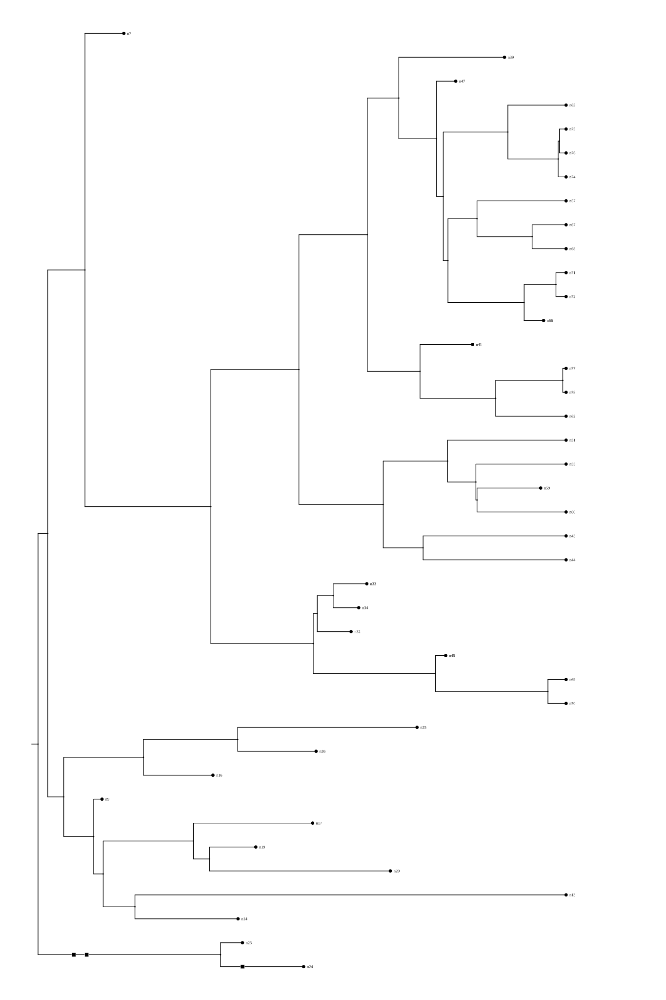

In [71]:
import pandas as pd
import ete3
import phylustrator as ph

# --- Load tree
with open("../../phylosim/Examples/Example1/Output/T/species_tree_full.newick") as f:
    t = ete3.Tree(f.readline().strip(), format=1)

# --- Add time_from_origin to nodes (needed for time-based placement)
for n in t.traverse("preorder"):
    n.time_from_origin = 0.0 if n.up is None else float(n.up.time_from_origin) + float(getattr(n, "dist", 0.0))

# --- Drawer
v_style = ph.TreeStyle(width=2000, height=3000)
v = ph.VerticalTreeDrawer(t, style=v_style)
v.draw()
v.add_leaf_names()

# --- Load events
events = pd.read_csv("../../phylosim/Examples/Example1/Output/E/trait_events.tsv", sep="\t")
evb = events.query("Trait == 'body'").copy()

# Mark different transitions differently (optional)
def shape_for(fr, to):
    if int(fr) < int(to):
        return "square"      # forward
    return "triangle"        # backward (shouldn't happen here)

specs = []
for _, r in evb.iterrows():
    specs.append({
        "branch": r["Branch"],
        "time": float(r["Time"]),      # absolute time
        "shape": shape_for(r["From"], r["To"]),
        "fill": "black",
        "size": 12,
        "stroke": "white",
        "stroke_width": 1,
    })

v.add_branch_shapes(specs, orient=None, offset=0)

display(v.d)

In [73]:
import os

In [74]:
# Pick the node you believe is the common ancestor of n24 and n23
ca = t.get_common_ancestor("n24", "n23")
print("CA name:", ca.name)
print("Children:", [c.name for c in ca.children])
print("Is there a PNG for it?",
      os.path.exists(f"/Users/aadria/Desktop/Github/phylosim/Examples/Example1/renders/{ca.name}.png"))

CA name: n2
Children: ['n23', 'n24']
Is there a PNG for it? True
